In [50]:
import tensorflow as tf
from tensorflow.keras.applications import VGG19
from tensorflow.keras.applications.vgg19 import preprocess_input
from tensorflow.keras.models import Model
import matplotlib.pyplot as plt
import os

In [2]:
def vgg_features(layer_names):
    vgg = VGG19(include_top = False, weights = "imagenet")
    vgg.trainable = False
    features = [vgg.get_layer(name).output for name in layer_names]
    return Model([vgg.input],features)

class VGG(Model):
    def __init__(self):
        super(VGG,self).__init__()
        self.content_features = ['block5_conv2']
        self.style_features = ['block1_conv1','block2_conv1','block3_conv1','block4_conv1','block5_conv1']
        self.vgg = vgg_features(self.style_features + self.content_features)
        self.num_style_features = len(self.style_features)
        self.vgg.trainable = False
    def call(self,inputs):
        inputs = inputs*255.0
        inputs = preprocess_input(inputs)
        outputs = self.vgg(inputs)
        return (outputs[:self.num_style_features],
                outputs[self.num_style_features:])

In [3]:
def load_image(image_path, imsize):
    image = tf.io.read_file(image_path)
    image = tf.image.decode_image(image, channels = 3)
    image = tf.image.convert_image_dtype(image, tf.float32)
    image = tf.image.resize(image,imsize)
    image = image[tf.newaxis, :]
    return image 

In [4]:
def clip_0_1(image):
    return tf.clip_by_value(image, clip_value_min=0.0, clip_value_max=1.0)

In [22]:
def gram_matrix(input_tensor):
    result = tf.linalg.einsum('bijc,bijd->bcd', input_tensor, input_tensor)
    input_shape = tf.shape(input_tensor)
    num_locations = tf.cast(input_shape[1]*input_shape[2], tf.float32)
    return result/(num_locations)

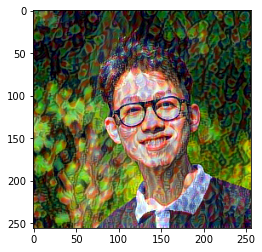

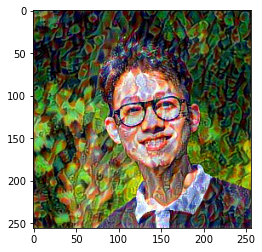

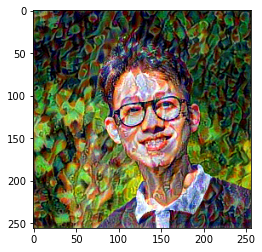

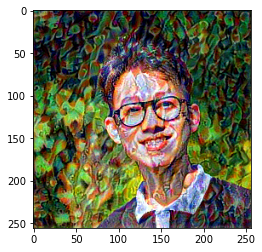

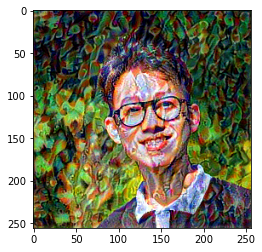

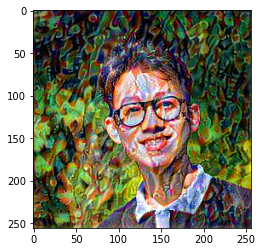

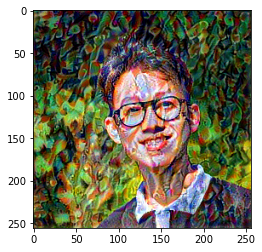

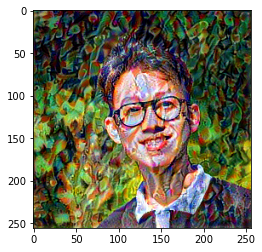

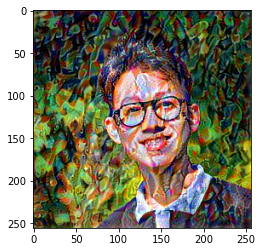

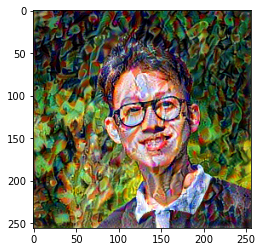

In [69]:
imsize = (256,256)
content_path = "nguyen_profile.jpg"
style_path = "styles/style9.jpg"
original_img = load_image(content_path,imsize)
style_img = load_image(style_path,imsize)
generated = tf.Variable(original_img)

model = VGG()
#take the content feature of the original image
original_img_features = model(original_img)[1]
#take style features of the style image
style_features = model(style_img)[0]


#hyperparameters 
optimizer = tf.optimizers.Adam(learning_rate=0.002, beta_1=0.99, epsilon=1e-1)
epochs = 10
steps_per_epoch = 100
gamma = 30
beta = 1e-2
alpha = 1e4

def training_loop(show = False):
    for e in range(epochs):
        for _ in range(steps_per_epoch):
            with tf.GradientTape() as tape:
                generated_style_features, generated_content_features = model(generated)

                original_loss = style_loss = 0

                num_content_features = len(generated_content_features)
                num_style_features = len(generated_style_features)

                for gen_feature, orig_feature in zip(generated_content_features, original_img_features):
                    original_loss += tf.math.reduce_mean((gen_feature - orig_feature) ** 2)
                for gen_feature, style_feature in zip(generated_style_features, style_features):
                    G = gram_matrix(gen_feature) 
                    A = gram_matrix(style_feature)
                    style_loss += tf.math.reduce_mean((G-A) ** 2)

                original_loss *= alpha/num_content_features
                style_loss *= beta/num_style_features
                total_loss = original_loss + style_loss
                total_loss += gamma*tf.image.total_variation(generated)
            grads = tape.gradient(total_loss, generated)
            optimizer.apply_gradients([(grads, generated)])
            generated.assign(clip_0_1(generated))
        if show :
            plt.imshow(generated[0])
            plt.show()
    return generated

generated = training_loop(show=True)

In [71]:
content_path = "nguyen_profile.jpg"
original_img = load_image(content_path,imsize)
original_img_features = model(original_img)[1]

styles_path = [os.path.join("styles",f) for f in os.listdir("styles") if f.endswith("jpg")]
generated_images = []
style_images = []
for style_path in styles_path:
    style_img = load_image(style_path,imsize)
    generated = tf.Variable(original_img)
    style_features = model(style_img)[0]
    style_images.append(style_img)
    generated_images.append(training_loop())

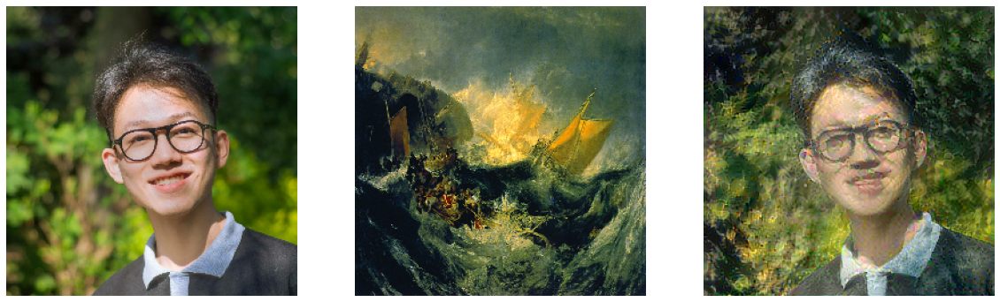

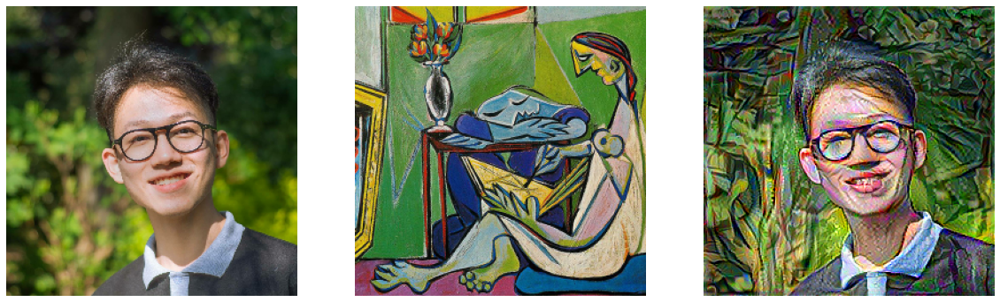

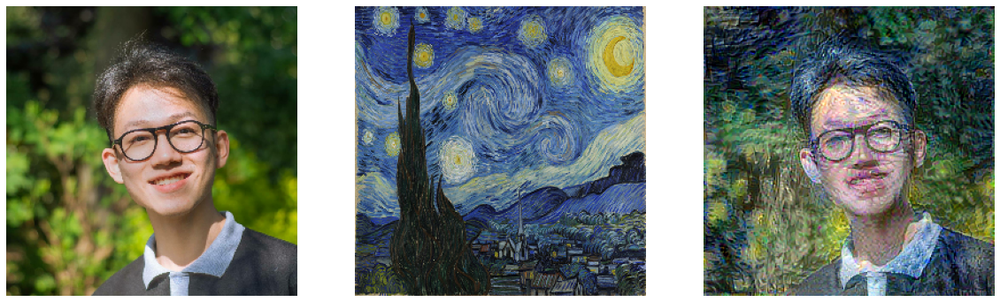

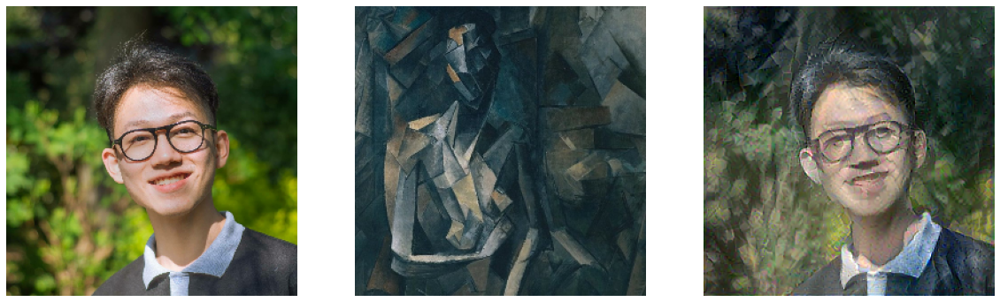

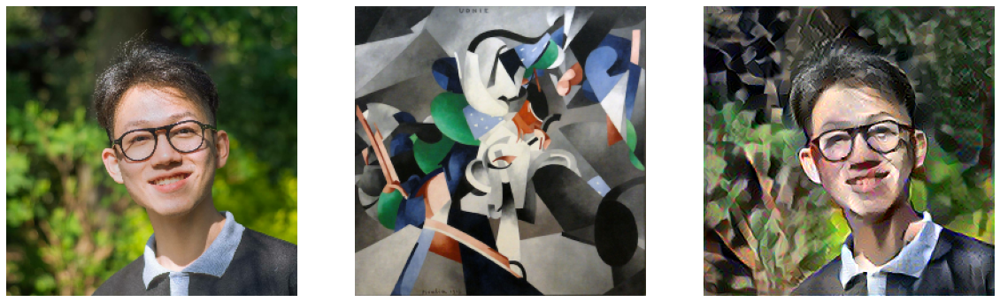

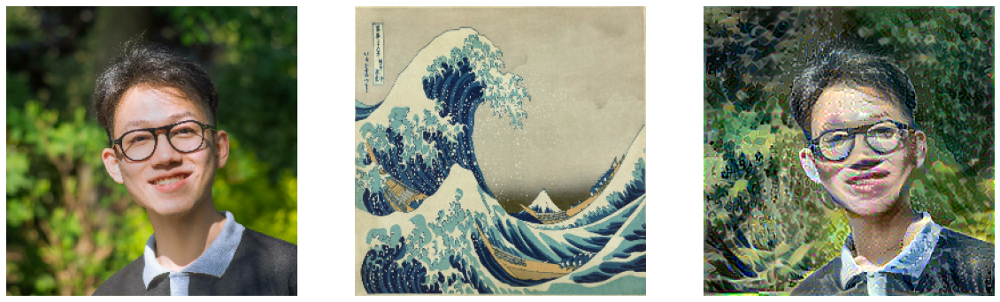

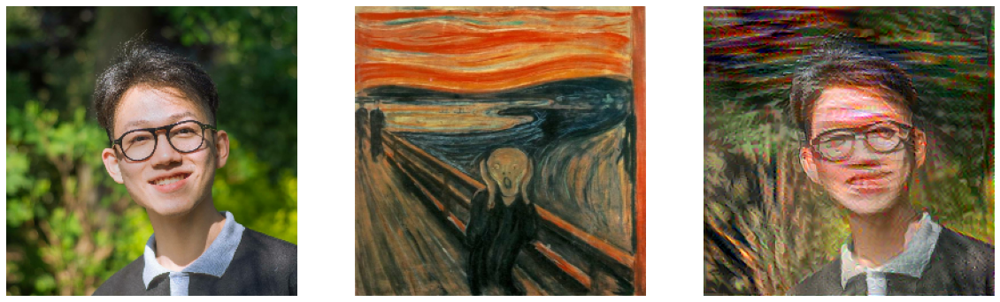

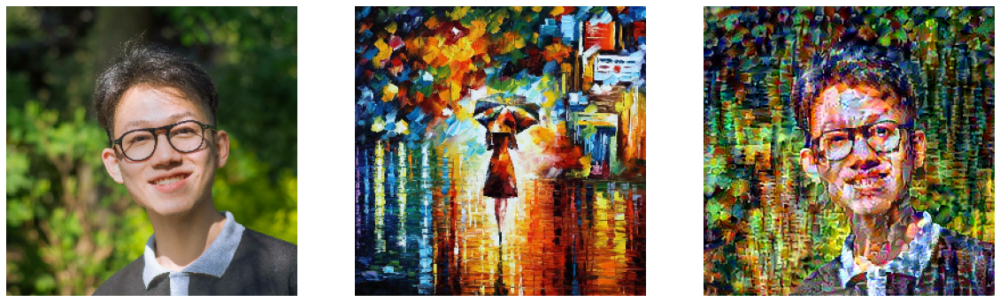

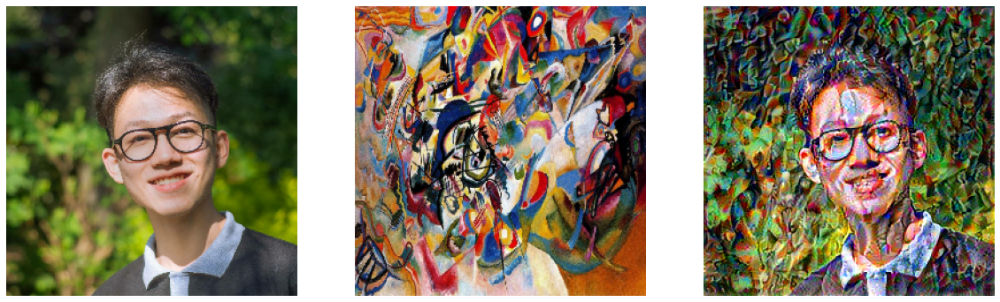

In [76]:
for style_img,gen_img in zip(style_images,generated_images):
    plt.figure(figsize = (20, 14))
    plt.subplot(1,3,1)
    plt.axis("off")
    plt.imshow(original_img[0])
    plt.subplot(1,3,2)
    plt.axis("off")
    plt.imshow(style_img[0])
    plt.subplot(1,3,3)
    plt.axis("off")
    plt.imshow(gen_img[0])
